In [1]:
from tvb.simulator.lab import *
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.colors as plc
import time as tm
import mest_function
from utils import *
import logging
logging.disable(logging.CRITICAL)
import warnings
warnings.filterwarnings("ignore")

In [2]:
# Data
data_path = '/Users/gpret/Desktop/MEDICINA/TVB_Distribution/demo_scripts/myScripts/For_OHBM/For_OHBM/tutorial_data'

In [3]:
con = connectivity.Connectivity.from_file(f'{data_path}/connectivity.vep.zip')
con.tract_lengths = np.zeros((con.tract_lengths.shape))             # no time-delays
con.weights[np.diag_indices(con.weights.shape[0])] = 0 #mette a zero i weights degli indici diagonali, che sono quelli di una
#area con se stessa
# con.weights = np.log(con.weights+1)
con.weights /= con.weights.max() # a /= b equivale a fare a = a/b
con.configure()
nb_regions = con.number_of_regions
roi = con.region_labels

In [4]:
# Coupling
coupl = coupling.Difference(a=np.array([-0.2]))

# Integrators
hiss = noise.Additive(nsig = np.array([0., 0., 0., 0.0003, 0.0003, 0.]))
heunint = integrators.HeunStochastic(dt=0.05, noise=hiss) 

# Monitors
mons = [monitors.TemporalAverage(period=3)]

## ATTENZIONE 
Le timeseries nelle analisi di spettro sono da dividere per 3.
Con dt troppo grandi (0.1) e x0 troppo bassi (<-2.4) non funziona. Mettere dt a 0.05

## Stimulus setup
Finché non risolvo la cosa dell'integratore, non mi serve

Stimuli applied from the SEEG electrode


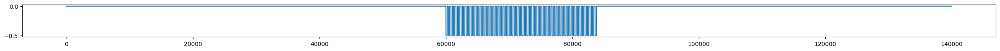

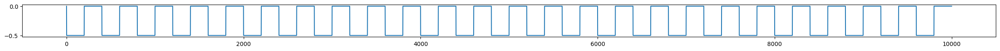

In [5]:
dt = 0.05
onset = 3000 # ms
stim_length = onset + 1200 # stimulation length (including onset) ms
simulation_length = 7000 # ms
freq = 50/1000 # frequency converted to 1/ms
T = 1/freq # pulse repetition period [ms]
tau = 10 # pulse width [ms]
I = .5 # intensity [mA]

# Temporal stimulation pattern
class vector1D(equations.DiscreteEquation):
    equation = equations.Final(default="emp")
eqn_t = vector1D()
parameters = {'T': T, 'tau': tau, 'amp': I, 'onset': onset}
pulse1, _ = equations.PulseTrain(parameters=parameters).get_series_data(max_range=stim_length, step=dt)
pulse1_ts = [p[1] for p in pulse1]
parameters = {'T': T, 'tau': tau, 'amp': I, 'onset': onset + tau}
pulse2, _ = equations.PulseTrain(parameters=parameters).get_series_data(max_range=stim_length, step=dt)
pulse2_ts = [p[1] for p in pulse2]
pulse_ts = -np.asarray(pulse1_ts) #- np.asarray(pulse2_ts)
stimulus_ts = np.hstack((pulse_ts[:-1], np.zeros(int(np.ceil((simulation_length - stim_length) / dt)))))
eqn_t.parameters['emp'] = np.copy(stimulus_ts)

print("Stimuli applied from the SEEG electrode")
plt.figure(figsize=(30, 1))
plt.plot(stimulus_ts)
plt.figure(figsize=(30, 1))
plt.plot(stimulus_ts[60000:70000])
plt.show()

## First try with stimulation to check it works

In [6]:
# Here we set up the EZ node such that it is close to the critical working point, i.e. the seizure threshold
x0ez=-2.1
x0pz=-2.1
x0num=-2.4

#Here I set the x0 emulating a temporal sclerosis, which is worse in in the anterior right hippocampus but also made 
#damage to nearby areas, as showed in common MRI findings (https://radiopaedia.org/articles/1664)

EZ = ['Right-Hippocampus-anterior']
PZ = ['Right-Hippocampus-posterior', 'Right-Parahippocampal-cortex', 'Right-Rhinal-cortex', 'Right-Amygdala', 'Right-T3-anterior', 
      'Right-Posterior-cingulate-cortex-dorsal', 'Right-Posterior-cingulate-cortex-retrosplenial-gyrus']
idx_EZ = np.where(roi == EZ)
idx_PZ = [np.where(roi == pz) for pz in PZ]

epileptors = models.Epileptor(r=np.array([0.00035]))
epileptors.x0 = x0num*np.ones(nb_regions)
epileptors.x0[idx_EZ] = x0ez
for id in idx_PZ:
    epileptors.x0[id] = x0pz
    x0pz -= 0.01

# Initial conditions
init_cond = np.array([-1.98742113e+00 , -1.87492138e+01, 4.0529597e+00, -1.05214059e+00, -4.95543740e-20, -1.98742113e-01])
print(init_cond)
init_cond_reshaped = np.repeat(init_cond, nb_regions).reshape((1, len(init_cond), nb_regions, 1))

# Spatial stimulation pattern (via weights accross the network nodes)
stim_weight = 3
stim_weights = np.zeros((nb_regions))
stim_weights[idx_EZ] = np.array([stim_weight])
stimulus = patterns.StimuliRegion(temporal=eqn_t,
                                  connectivity=con,
                                  weight=stim_weights)
stimulus.configure_space()
stimulus.configure_time(np.arange(0., np.size(stimulus_ts), 1))

# Simulator
sim = simulator.Simulator(model=epileptors,
                          stimulus=stimulus, 
                          initial_conditions=init_cond_reshaped,
                          connectivity=con,
                          coupling=coupl,
                          integrator=heunint,
                          monitors=mons)

sim.configure()

# Run
simulation_length = 7000
print("Starting simulation...")
tic = tm.time()
ttavg = sim.run(simulation_length=simulation_length)
print("Finished simulation.")
print('execute for ' + str(tm.time()-tic))

[-1.98742113e+00 -1.87492138e+01  4.05295970e+00 -1.05214059e+00
 -4.95543740e-20 -1.98742113e-01]
Starting simulation...
Finished simulation.
execute for 292.98772954940796


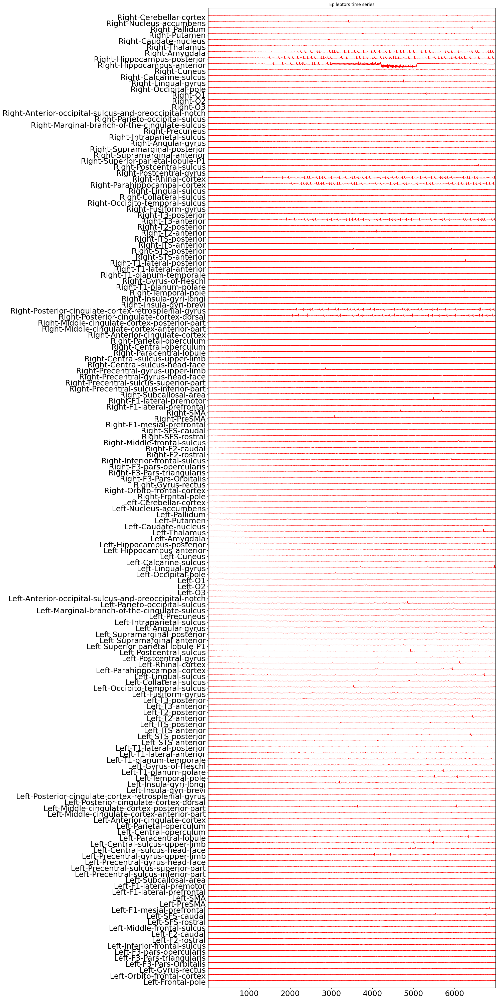

In [7]:
tts = ttavg[0][0]
tavg = ttavg[0][1]
srcSig = tavg[:,0,:,0]
start_idx = 0
end_idx = tavg.shape[0]

srcSig_normal=srcSig/np.ptp(srcSig)
#Plot raw time series
figure= plt.figure(figsize=(20,40))
plt.plot(tts[start_idx:end_idx], srcSig_normal[start_idx:end_idx] + np.r_[:162], 'r')
plt.title("Epileptors time series")
roi = con.region_labels
plt.yticks(np.arange(len(roi)),roi, fontsize=22)

# These should be set manually, since they depend on the model parameters
plt.xticks(fontsize=22)
plt.ylim([-1,len(roi)+0.5])
plt.xlim([tts[start_idx],tts[end_idx-1]])
plt.tight_layout()
plt.show()

In [8]:
#np.where(roi=='Right-Hippocampus-anterior')[0][0]

## Signal analysis and plottings

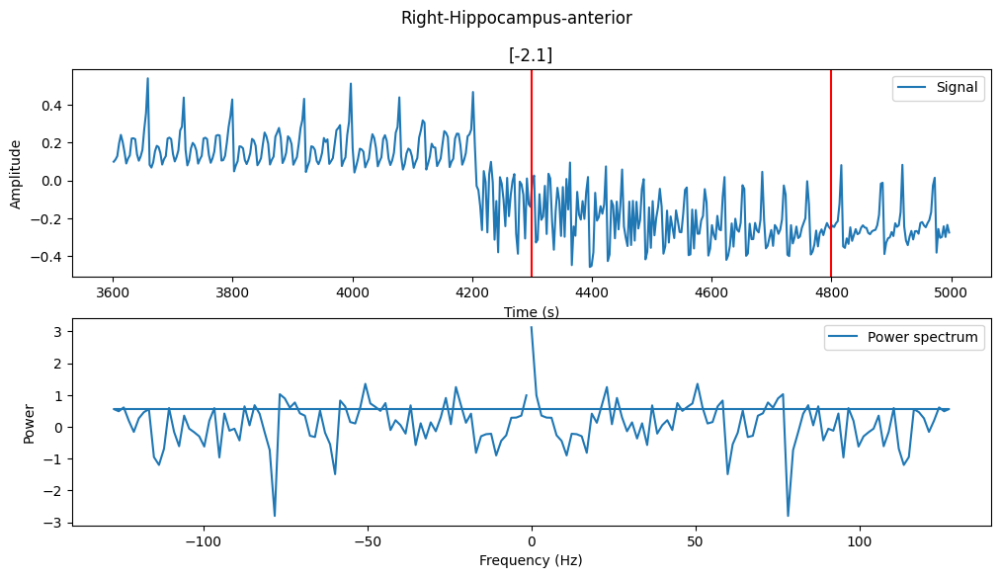

The Power peak is:  3.127510159986289
The Peak to peak amplitude is:  0.5513010772846301
The absoute power is:  0.0640225208034798
The variance of the amplitude of the signal is:  0.015930035860167713


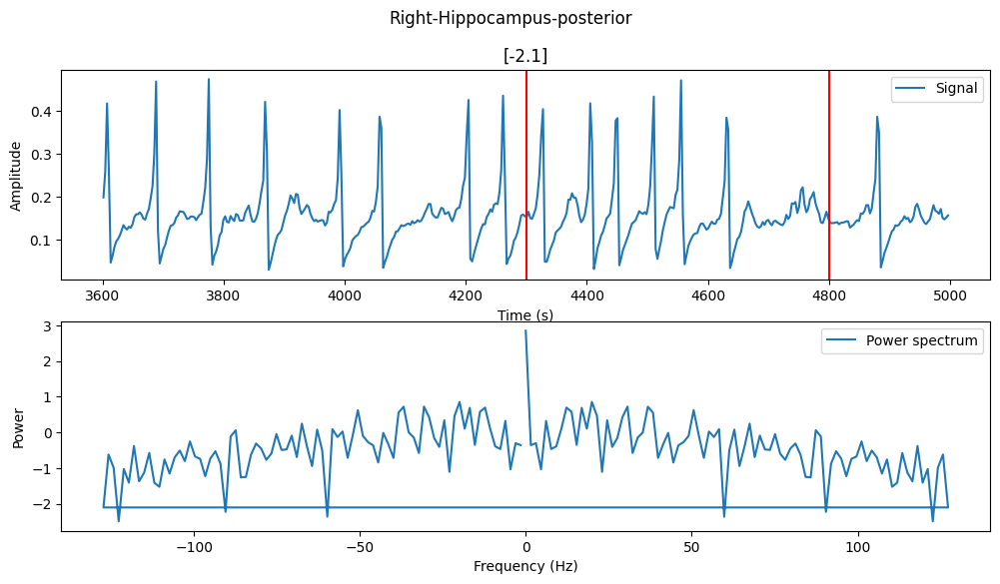

The Power peak is:  2.8504957301880354
The Peak to peak amplitude is:  0.43946386120991776
The absoute power is:  0.031017994921748178
The variance of the amplitude of the signal is:  0.005604594002964281


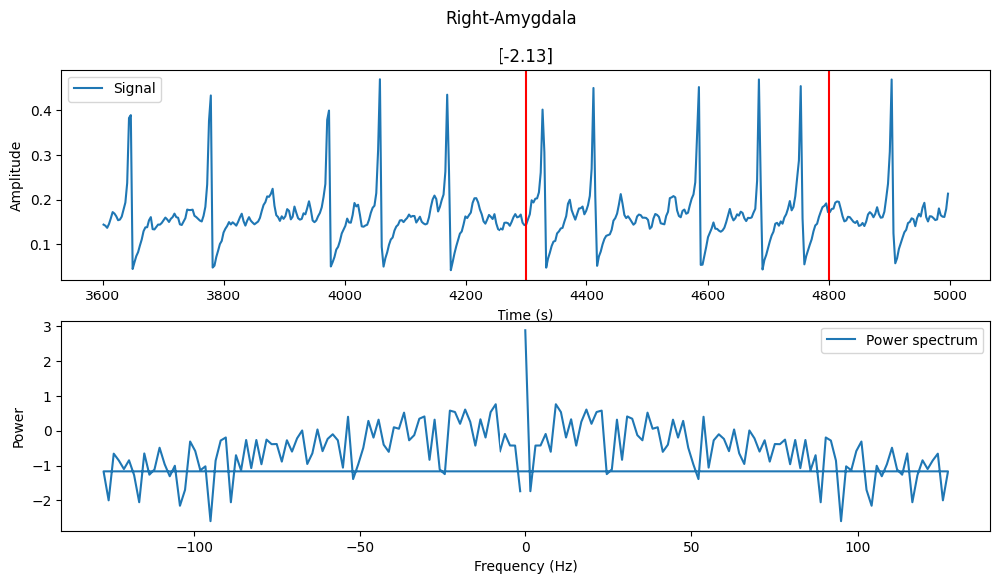

The Power peak is:  2.883401139523078
The Peak to peak amplitude is:  0.4254219965512218
The absoute power is:  0.03200813518065795
The variance of the amplitude of the signal is:  0.004594401003953955


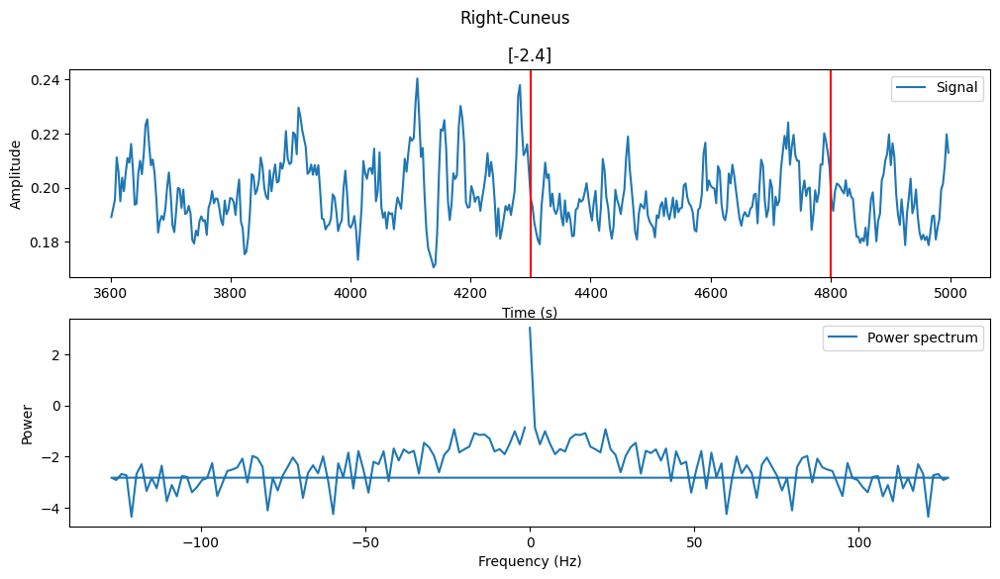

The Power peak is:  3.0317020745572485
The Peak to peak amplitude is:  0.04499607345664705
The absoute power is:  0.03865628422794601
The variance of the amplitude of the signal is:  8.455296680740533e-05


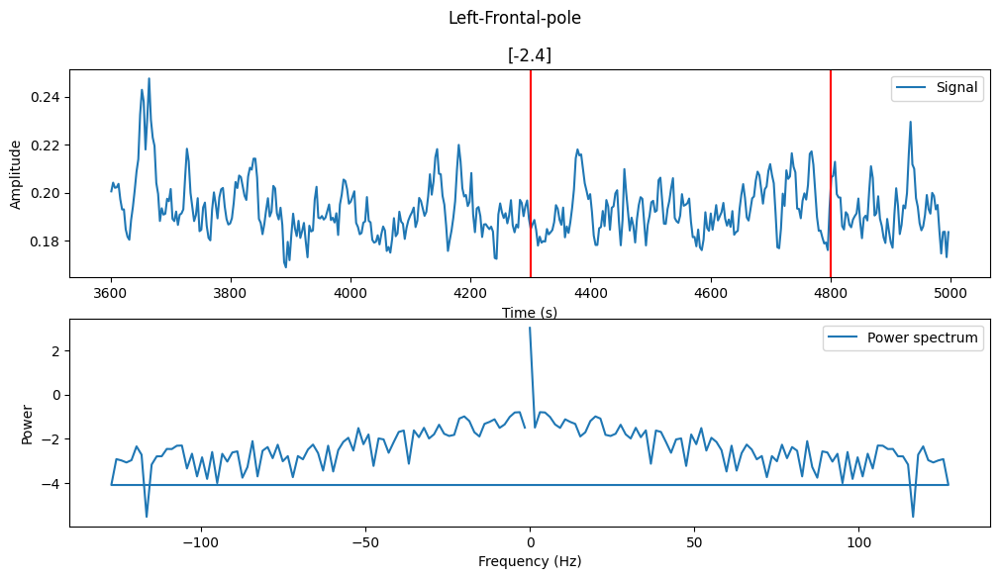

The Power peak is:  3.01556923148172
The Peak to peak amplitude is:  0.0419674869547052
The absoute power is:  0.037264807688169664
The variance of the amplitude of the signal is:  9.962352500388862e-05


In [9]:
myroi = ['Right-Hippocampus-anterior', 'Right-Hippocampus-posterior', 'Right-Amygdala', 'Right-Cuneus', 'Left-Frontal-pole']
PpA = []
p2paA = []
abspowerA = []
varianceA = []

for k in myroi:    
    mySig = srcSig_normal[int(4300/3):int(4800/3), np.where(roi==k)[0][0]]
    power = np.mean(np.abs(mySig)**2)
    power
    # Compute the FFT and the power spectrum
    X = np.fft.fft(mySig) # FFT array
    P = np.abs(X)**2 # Power spectrum array
    f = np.fft.fftfreq(len(mySig), 1/256) # Frequency array

    # Shift the spectrum and the frequencies
    #X = np.fft.fftshift(X) # Shifted FFT array
    #P = np.fft.fftshift(P) # Shifted power spectrum array
    #f = np.fft.fftshift(f) # Shifted frequency array

    P = np.log10(P)

    # Plot the signal and the spectrum
    plt.figure(figsize=(12,6))
    plt.subplot(211)
    plt.plot(tts[int(3600/3):int(5000/3)], srcSig_normal[int(3600/3):int(5000/3), np.where(roi==k)[0][0]], label='Signal')
    plt.suptitle(k)
    plt.title(epileptors.x0[np.where(roi==k)])
    plt.xlabel('Time (s)')
    plt.ylabel('Amplitude')
    plt.axvline(x=4300, color='r')
    plt.axvline(x=4800, color='r')
    plt.legend()
    plt.subplot(212)
    plt.plot(f, P, label='Power spectrum')
    plt.xlabel('Frequency (Hz)')
    plt.ylabel('Power')
    #plt.xlim(0, 40) # Zoom in to the relevant frequency range
    plt.legend()
    plt.show()
    
    Pp = max(P)
    print('The Power peak is: ', Pp)
    PpA.append(Pp)
    
    #Peak to peak amplitude
    p2pa = max(mySig) - min(mySig)
    print('The Peak to peak amplitude is: ', p2pa)
    p2paA.append(p2pa)
    
    #Absolute power
    abspower = np.mean(mySig**2)
    print('The absoute power is: ', abspower)
    abspowerA.append(abspower)
    
    #Variance of the amplitude
    variance = np.mean((mySig - np.mean(mySig))**2)
    print('The variance of the amplitude of the signal is: ', variance)
    varianceA.append(variance)

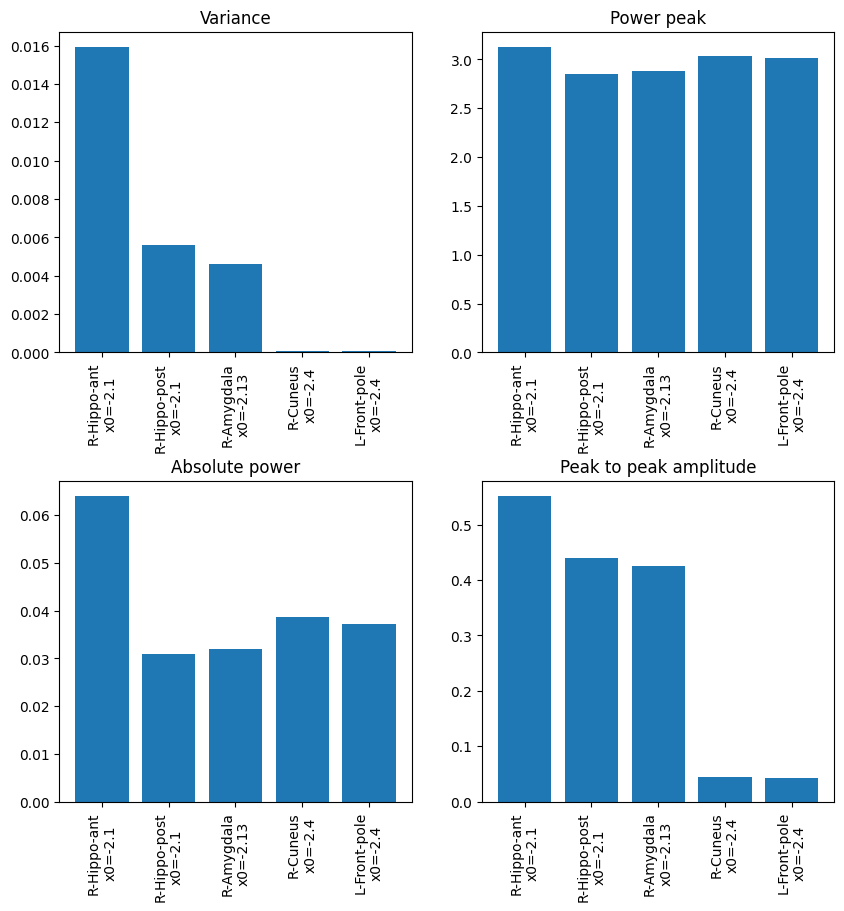

In [10]:
myshortroi = ['R-Hippo-ant', 'R-Hippo-post', 'R-Amygdala', 'R-Cuneus', 'L-Front-pole']
strxo = []
for j in myroi:
    strxo.append(str(round(float(epileptors.x0[np.where(roi==j)][0]),3)))
myx0roi = []  
for jj, kk in enumerate(myshortroi):
    myx0roi.append(kk+"\nx0="+strxo[jj])

fig, ax = plt.subplots(nrows=2, ncols=2, figsize = (10,10))

ax[0][0].bar(np.arange(0,len(myroi),1), varianceA)
ax[0][0].tick_params(axis='x', rotation=90)
ax[0][0].set_xticks(np.arange(0,len(myroi),1), labels = myx0roi)
ax[0][0].set_title("Variance")

ax[1][0].bar(np.arange(0,len(myroi),1), abspowerA)
ax[1][0].tick_params(axis='x', rotation=90)
ax[1][0].set_xticks(np.arange(0,len(myroi),1), labels = myx0roi)
ax[1][0].set_title("Absolute power")

ax[0][1].bar(np.arange(0,len(myroi),1), PpA)
ax[0][1].tick_params(axis='x', rotation=90)
ax[0][1].set_xticks(np.arange(0,len(myroi),1), labels = myx0roi)
ax[0][1].set_title("Power peak")

ax[1][1].bar(np.arange(0,len(myroi),1), p2paA)
ax[1][1].tick_params(axis='x', rotation=90)
ax[1][1].set_xticks(np.arange(0,len(myroi),1), labels = myx0roi)
ax[1][1].set_title("Peak to peak amplitude")

plt.subplots_adjust(hspace=0.4)
plt.show()


## Now let's apply the drug

-2.461000000000062 became -2.708000000000035
-2.708000000000035


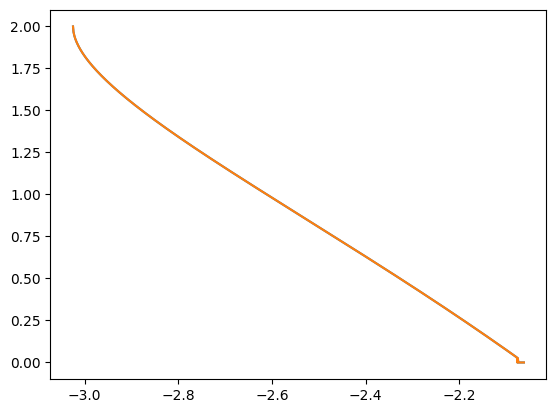

In [64]:
drug = 'valproate'
dose = 15
starting_x0ez = x0ez
#starting_x0pz = x0ez

final_x0ez = mest_function.dose_effect(drug, dose, starting_x0ez)
all_the_deltas, X0s = mest_function.f1_find_the_delta()
#final_x0pz = round(mest_function.dose_effect(drug, dose, starting_x0pz),3)


print(final_x0ez)

In [12]:
# Here we set up the EZ node such that it is close to the critical working point, i.e. the seizure threshold
x0ez= final_x0ez
x0pz= final_x0ez
x0num=-2.4

epileptors = models.Epileptor(r=np.array([0.00035]))
epileptors.x0 = x0num*np.ones(nb_regions)
epileptors.x0[idx_EZ] = x0ez
for id in idx_PZ:
    epileptors.x0[id] = x0pz
    x0pz -= 0.01

# Initial conditions
init_cond = np.array([-1.98742113e+00 , -1.87492138e+01, 4.0529597e+00, -1.05214059e+00, -4.95543740e-20, -1.98742113e-01])
print(init_cond)
init_cond_reshaped = np.repeat(init_cond, nb_regions).reshape((1, len(init_cond), nb_regions, 1))

# Simulator
sim = simulator.Simulator(model=epileptors,
                          stimulus=stimulus, 
                          initial_conditions=init_cond_reshaped,
                          connectivity=con,
                          coupling=coupl,
                          integrator=heunint,
                          monitors=mons)

sim.configure()

# Run
simulation_length = 7000
print("Starting simulation...")
tic = tm.time()
ttavg = sim.run(simulation_length=simulation_length)
print("Finished simulation.")
print('execute for ' + str(tm.time()-tic))

[-1.98742113e+00 -1.87492138e+01  4.05295970e+00 -1.05214059e+00
 -4.95543740e-20 -1.98742113e-01]
Starting simulation...
Finished simulation.
execute for 267.6912786960602


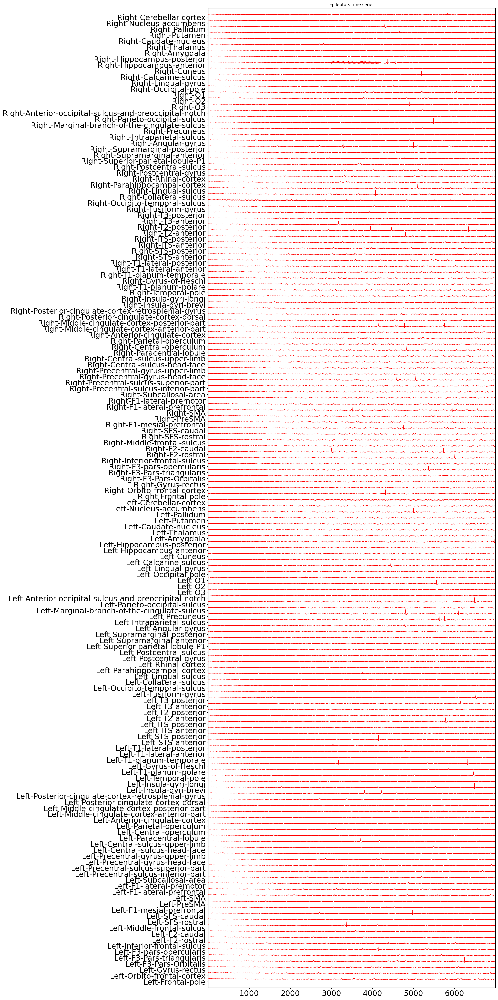

In [13]:
tts = ttavg[0][0]
tavg = ttavg[0][1]
srcSig = tavg[:,0,:,0]
start_idx = 0
end_idx = tavg.shape[0]

srcSig_normal=srcSig/np.ptp(srcSig)
#Plot raw time series
figure= plt.figure(figsize=(20,40))
plt.plot(tts[start_idx:end_idx], srcSig_normal[start_idx:end_idx] + np.r_[:162], 'r')
plt.title("Epileptors time series")
roi = con.region_labels
plt.yticks(np.arange(len(roi)),roi, fontsize=22)

# These should be set manually, since they depend on the model parameters
plt.xticks(fontsize=22)
plt.ylim([-1,len(roi)+0.5])
plt.xlim([tts[start_idx],tts[end_idx-1]])
plt.tight_layout()
plt.show()

## Hippo anterior

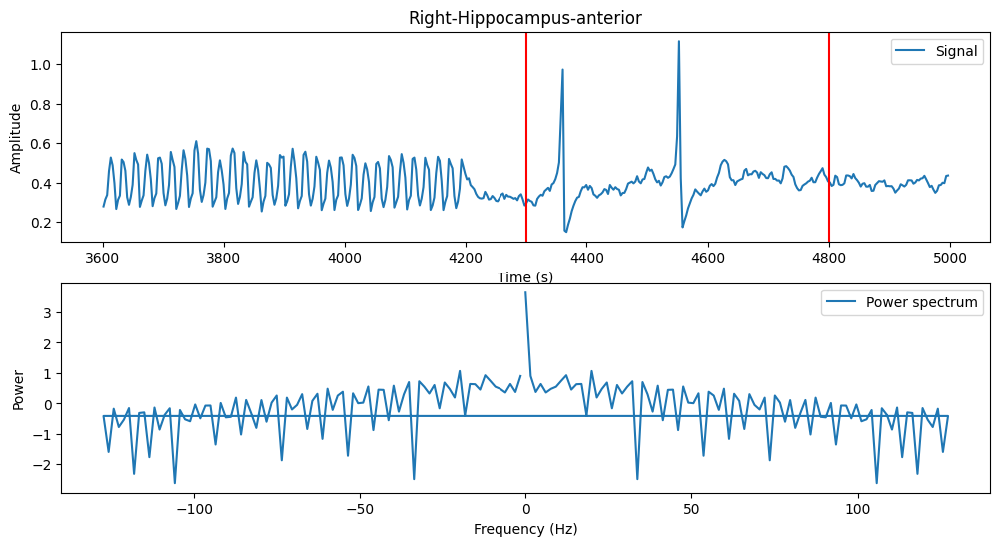

The Power peak is:  3.6494172251326082
The Peak to peak amplitude is:  0.9655203622915194
The absoute power is:  0.17049985488768699
The variance of the amplitude of the signal is:  0.010549840738647101


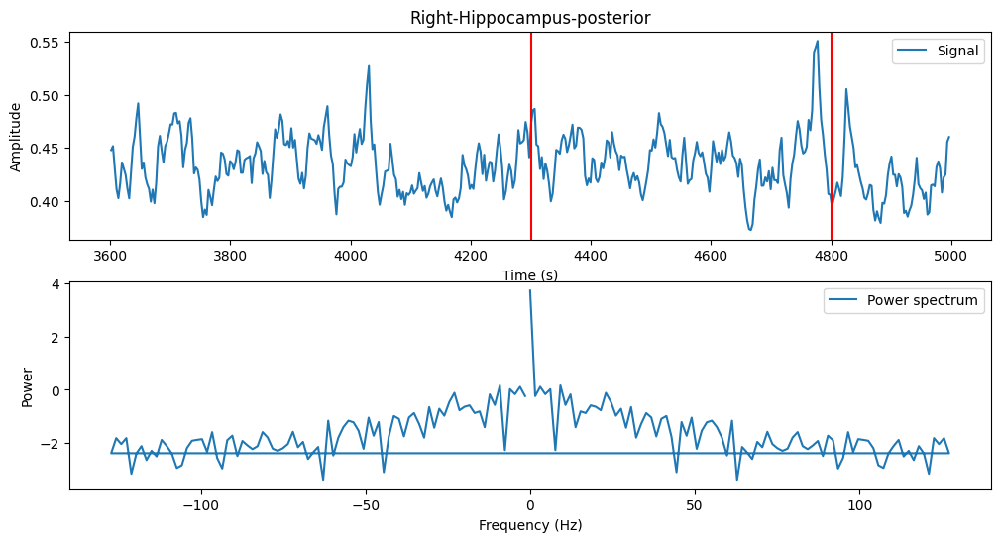

The Power peak is:  3.731573572806167
The Peak to peak amplitude is:  0.1784768821442831
The absoute power is:  0.1939780587676047
The variance of the amplitude of the signal is:  0.0007186571515332039


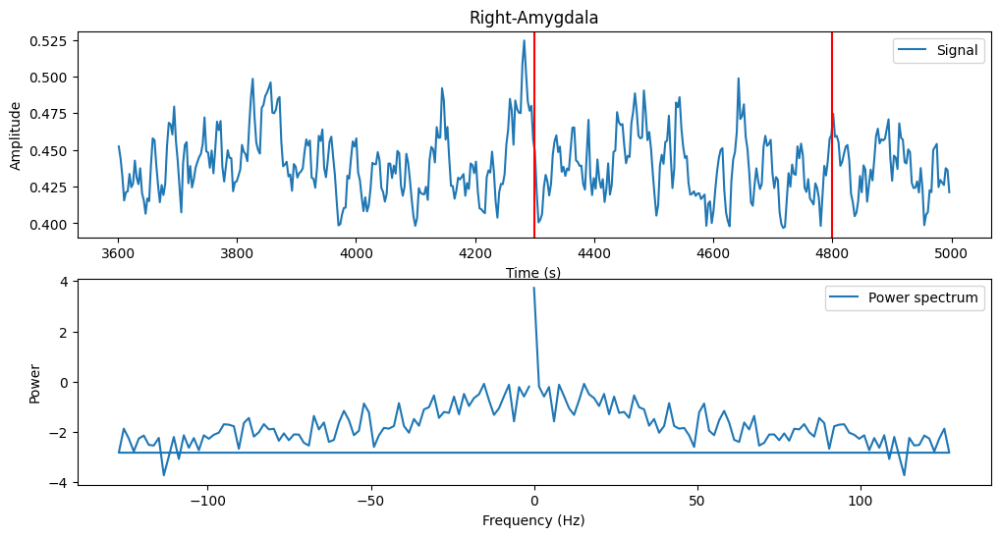

The Power peak is:  3.7285056442155082
The Peak to peak amplitude is:  0.10192632643935923
The absoute power is:  0.1923725147753142
The variance of the amplitude of the signal is:  0.0004735190525968434


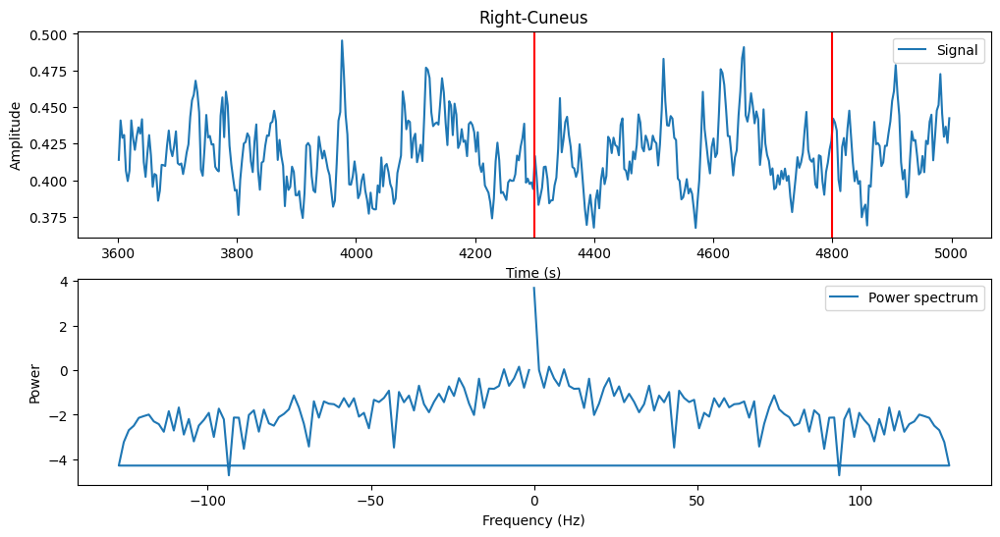

The Power peak is:  3.685141141385059
The Peak to peak amplitude is:  0.12352795113424714
The absoute power is:  0.17421458249797034
The variance of the amplitude of the signal is:  0.0005512226223063127


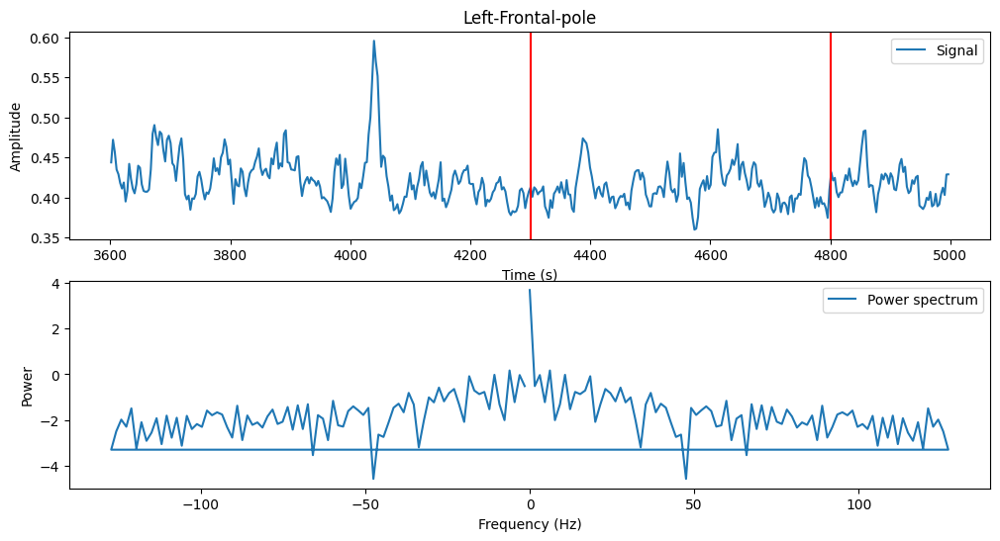

The Power peak is:  3.6757702188292014
The Peak to peak amplitude is:  0.12551078868792676
The absoute power is:  0.17046814267215205
The variance of the amplitude of the signal is:  0.0005118392535222625


In [14]:
myroi = ['Right-Hippocampus-anterior', 'Right-Hippocampus-posterior', 'Right-Amygdala', 'Right-Cuneus', 'Left-Frontal-pole']
PpA1 = []
p2paA1 = []
abspowerA1 = []
varianceA1 = []

for k in myroi:    
    mySig = srcSig_normal[int(4300/3):int(4800/3), np.where(roi==k)[0][0]]
    power = np.mean(np.abs(mySig)**2)
    power
    # Compute the FFT and the power spectrum
    X = np.fft.fft(mySig) # FFT array
    P = np.abs(X)**2 # Power spectrum array
    f = np.fft.fftfreq(len(mySig), 1/256) # Frequency array

    # Shift the spectrum and the frequencies
    #X = np.fft.fftshift(X) # Shifted FFT array
    #P = np.fft.fftshift(P) # Shifted power spectrum array
    #f = np.fft.fftshift(f) # Shifted frequency array

    P = np.log10(P)

    # Plot the signal and the spectrum
    plt.figure(figsize=(12,6))
    plt.subplot(211)
    plt.plot(tts[int(3600/3):int(5000/3)], srcSig_normal[int(3600/3):int(5000/3), np.where(roi==k)[0][0]], label='Signal')
    plt.title(k)
    plt.xlabel('Time (s)')
    plt.ylabel('Amplitude')
    plt.axvline(x=4300, color='r')
    plt.axvline(x=4800, color='r')
    plt.legend()
    plt.subplot(212)
    plt.plot(f, P, label='Power spectrum')
    plt.xlabel('Frequency (Hz)')
    plt.ylabel('Power')
    #plt.xlim(0, 40) # Zoom in to the relevant frequency range
    plt.legend()
    plt.show()
    
    Pp = max(P)
    print('The Power peak is: ', Pp)
    PpA1.append(Pp)
    
    #Peak to peak amplitude
    p2pa = max(mySig) - min(mySig)
    print('The Peak to peak amplitude is: ', p2pa)
    p2paA1.append(p2pa)
    
    #Absolute power
    abspower = np.mean(mySig**2)
    print('The absoute power is: ', abspower)
    abspowerA1.append(abspower)
    
    #Variance of the amplitude
    variance = np.mean((mySig - np.mean(mySig))**2)
    print('The variance of the amplitude of the signal is: ', variance)
    varianceA1.append(variance)

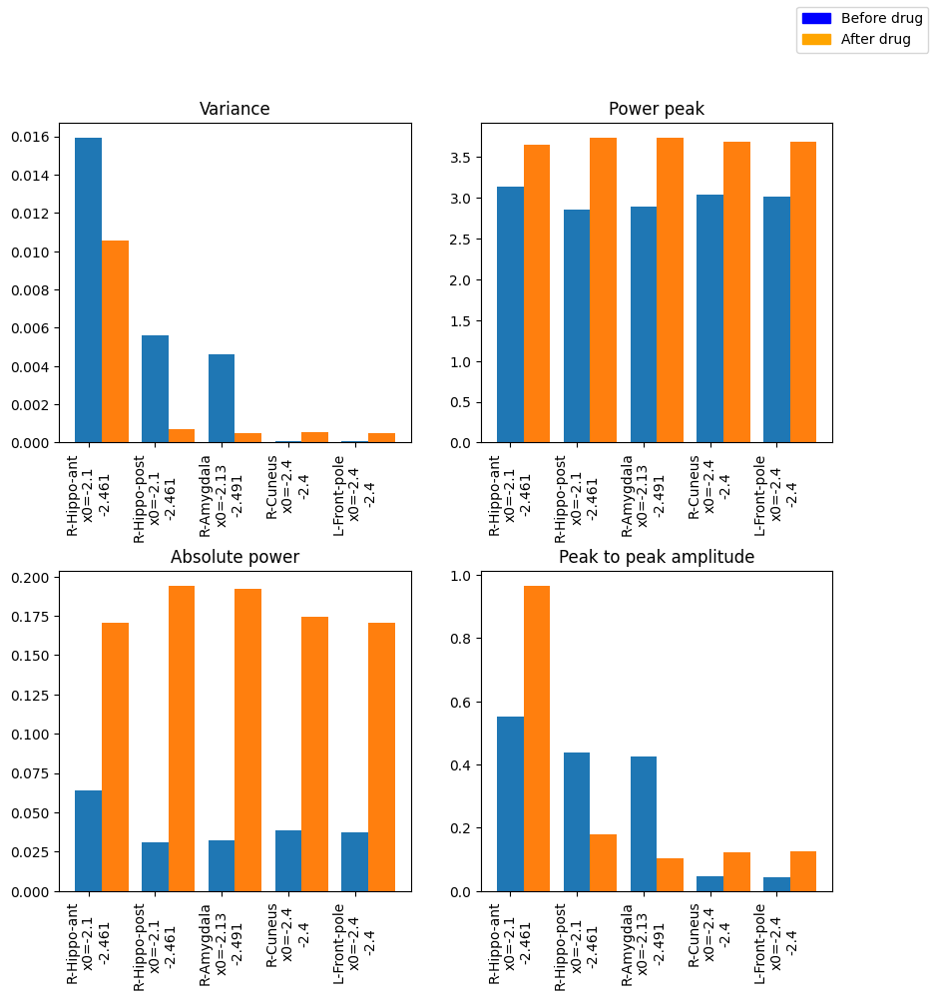

In [32]:
import matplotlib.patches as mpatch

myshortroi = ['R-Hippo-ant', 'R-Hippo-post', 'R-Amygdala', 'R-Cuneus', 'L-Front-pole']

newstrxo = []
for j in myroi:
    newstrxo.append(str(round(float(epileptors.x0[np.where(roi==j)][0]),3)))
myx0roi = []  
for jj, kk in enumerate(myshortroi):
    myx0roi.append(kk+"\nx0="+strxo[jj]+"\n"+newstrxo[jj])

fig, ax = plt.subplots(nrows=2, ncols=2, figsize = (10,10))

width = 0.4

ax[0][0].bar(np.arange(0,len(myroi),1), varianceA, width = width)
ax[0][0].bar(np.arange(0,len(myroi),1)+width, varianceA1, width = width)
ax[0][0].tick_params(axis='x', rotation=90)
ax[0][0].set_xticks(np.arange(0,len(myroi),1), labels = myx0roi)
ax[0][0].set_title("Variance")

ax[1][0].bar(np.arange(0,len(myroi),1), abspowerA, width = width)
ax[1][0].bar(np.arange(0,len(myroi),1)+width, abspowerA1, width = width)
ax[1][0].tick_params(axis='x', rotation=90)
ax[1][0].set_xticks(np.arange(0,len(myroi),1), labels = myx0roi)
ax[1][0].set_title("Absolute power")

ax[0][1].bar(np.arange(0,len(myroi),1), PpA, width = width)
ax[0][1].bar(np.arange(0,len(myroi),1)+width, PpA1, width = width)
ax[0][1].tick_params(axis='x', rotation=90)
ax[0][1].set_xticks(np.arange(0,len(myroi),1), labels = myx0roi)
ax[0][1].set_title("Power peak")

ax[1][1].bar(np.arange(0,len(myroi),1), p2paA, width = width)
ax[1][1].bar(np.arange(0,len(myroi),1)+width, p2paA1, width = width)
ax[1][1].tick_params(axis='x', rotation=90)
ax[1][1].set_xticks(np.arange(0,len(myroi),1), labels = myx0roi)
ax[1][1].set_title("Peak to peak amplitude")

plt.subplots_adjust(hspace=0.4)
orange_patch = mpatch.Patch(color = 'orange', label = 'After drug')
blue_patch = mpatch.Patch(color = 'blue', label = 'Before drug')
fig.legend(handles = [blue_patch, orange_patch])

plt.show()


## Now let's what new stimulus is needed for making it seize again :)

Stimuli applied from the SEEG electrode =  0.57


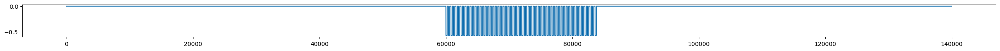

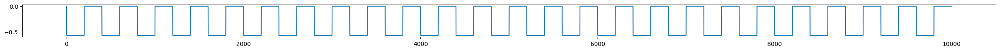

In [99]:
dt = 0.05
onset = 3000 # ms
stim_length = onset + 1200 # stimulation length (including onset) ms
simulation_length = 7000 # ms
freq = 50/1000 # frequency converted to 1/ms
T = 1/freq # pulse repetition period [ms]
tau = 10 # pulse width [ms]
I = 0.57 #round(all_the_deltas[np.where(X0s == round(x0ez, 3))[0][0]], 2) # intensity [mA]

# Temporal stimulation pattern
class vector1D(equations.DiscreteEquation):
    equation = equations.Final(default="emp")
eqn_t = vector1D()
parameters = {'T': T, 'tau': tau, 'amp': I, 'onset': onset}
pulse1, _ = equations.PulseTrain(parameters=parameters).get_series_data(max_range=stim_length, step=dt)
pulse1_ts = [p[1] for p in pulse1]
parameters = {'T': T, 'tau': tau, 'amp': I, 'onset': onset + tau}
pulse2, _ = equations.PulseTrain(parameters=parameters).get_series_data(max_range=stim_length, step=dt)
pulse2_ts = [p[1] for p in pulse2]
pulse_ts = -np.asarray(pulse1_ts) #- np.asarray(pulse2_ts)
stimulus_ts = np.hstack((pulse_ts[:-1], np.zeros(int(np.ceil((simulation_length - stim_length) / dt)))))
eqn_t.parameters['emp'] = np.copy(stimulus_ts)

print("Stimuli applied from the SEEG electrode = ", I)
plt.figure(figsize=(30, 1))
plt.plot(stimulus_ts)
plt.figure(figsize=(30, 1))
plt.plot(stimulus_ts[60000:70000])
plt.show()

In [100]:
# Initial conditions
init_cond = np.array([-1.98742113e+00 , -1.87492138e+01, 4.0529597e+00, -1.05214059e+00, -4.95543740e-20, -1.98742113e-01])
print(init_cond)
init_cond_reshaped = np.repeat(init_cond, nb_regions).reshape((1, len(init_cond), nb_regions, 1))

# Spatial stimulation pattern (via weights accross the network nodes)
stim_weight = 3
stim_weights = np.zeros((nb_regions))
stim_weights[idx_EZ] = np.array([stim_weight])
stimulus = patterns.StimuliRegion(temporal=eqn_t,
                                  connectivity=con,
                                  weight=stim_weights)
stimulus.configure_space()
stimulus.configure_time(np.arange(0., np.size(stimulus_ts), 1))

# Simulator
sim = simulator.Simulator(model=epileptors,
                          stimulus=stimulus, 
                          initial_conditions=init_cond_reshaped,
                          connectivity=con,
                          coupling=coupl,
                          integrator=heunint,
                          monitors=mons)

sim.configure()

# Run
simulation_length = 7000
print("Starting simulation...")
tic = tm.time()
ttavg = sim.run(simulation_length=simulation_length)
print("Finished simulation.")
print('execute for ' + str(tm.time()-tic))

[-1.98742113e+00 -1.87492138e+01  4.05295970e+00 -1.05214059e+00
 -4.95543740e-20 -1.98742113e-01]
Starting simulation...
Finished simulation.
execute for 173.3327386379242


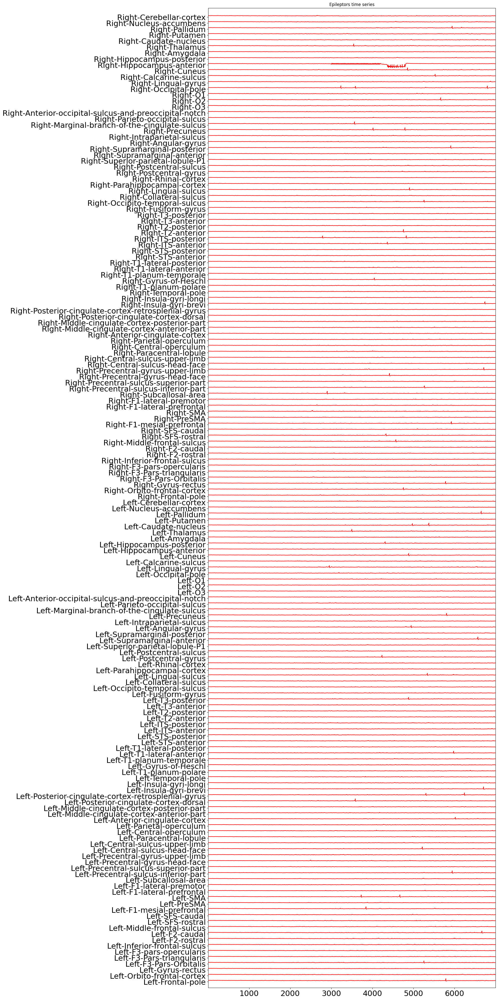

In [101]:
tts = ttavg[0][0]
tavg = ttavg[0][1]
srcSig = tavg[:,0,:,0]
start_idx = 0
end_idx = tavg.shape[0]

srcSig_normal=srcSig/np.ptp(srcSig)
#Plot raw time series
figure= plt.figure(figsize=(20,40))
plt.plot(tts[start_idx:end_idx], srcSig_normal[start_idx:end_idx] + np.r_[:162], 'r')
plt.title("Epileptors time series")
roi = con.region_labels
plt.yticks(np.arange(len(roi)),roi, fontsize=22)

# These should be set manually, since they depend on the model parameters
plt.xticks(fontsize=22)
plt.ylim([-1,len(roi)+0.5])
plt.xlim([tts[start_idx],tts[end_idx-1]])
plt.tight_layout()
plt.show()

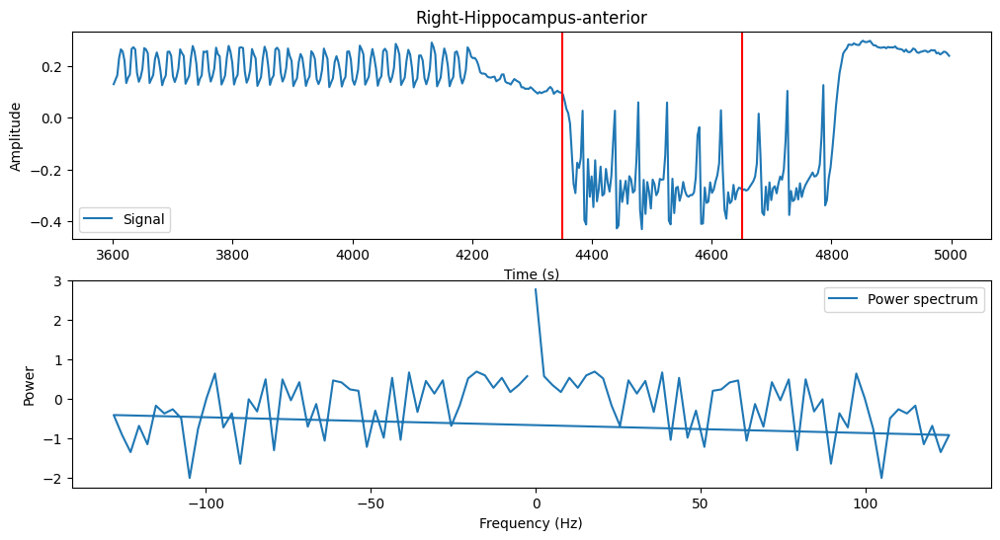

The Power peak is:  2.774484629002403
The Peak to peak amplitude is:  0.5218225269771768
The absoute power is:  0.07396894436066236
The variance of the amplitude of the signal is:  0.014473374450515464


In [102]:
myroi = ['Right-Hippocampus-anterior']
PpA1 = []
p2paA1 = []
abspowerA1 = []
varianceA1 = []

for k in myroi:    
    mySig = srcSig_normal[int(4350/3):int(4650/3), np.where(roi==k)[0][0]]
    power = np.mean(np.abs(mySig)**2)
    power
    # Compute the FFT and the power spectrum
    X = np.fft.fft(mySig) # FFT array
    P = np.abs(X)**2 # Power spectrum array
    f = np.fft.fftfreq(len(mySig), 1/256) # Frequency array

    # Shift the spectrum and the frequencies
    #X = np.fft.fftshift(X) # Shifted FFT array
    #P = np.fft.fftshift(P) # Shifted power spectrum array
    #f = np.fft.fftshift(f) # Shifted frequency array

    P = np.log10(P)

    # Plot the signal and the spectrum
    plt.figure(figsize=(12,6))
    plt.subplot(211)
    plt.plot(tts[int(3600/3):int(5000/3)], srcSig_normal[int(3600/3):int(5000/3), np.where(roi==k)[0][0]], label='Signal')
    plt.title(k)
    plt.xlabel('Time (s)')
    plt.ylabel('Amplitude')
    plt.axvline(x=4350, color='r')
    plt.axvline(x=4650, color='r')
    plt.legend()
    plt.subplot(212)
    plt.plot(f, P, label='Power spectrum')
    plt.xlabel('Frequency (Hz)')
    plt.ylabel('Power')
    #plt.xlim(0, 40) # Zoom in to the relevant frequency range
    plt.legend()
    plt.show()
    
    Pp = max(P)
    print('The Power peak is: ', Pp)
    PpA1.append(Pp)
    
    #Peak to peak amplitude
    p2pa = max(mySig) - min(mySig)
    print('The Peak to peak amplitude is: ', p2pa)
    p2paA1.append(p2pa)
    
    #Absolute power
    abspower = np.mean(mySig**2)
    print('The absoute power is: ', abspower)
    abspowerA1.append(abspower)
    
    #Variance of the amplitude
    variance = np.mean((mySig - np.mean(mySig))**2)
    print('The variance of the amplitude of the signal is: ', variance)
    varianceA1.append(variance)